## imfit test

Trying to get PyImfit to work on my virtual environment -- I was encountering some multiprocessing error. (Fixed as of Aug. 7!)

In [1]:
# math, array manipulation, etc.
import numpy as np

# timing
from timeit import default_timer

import astropy.io.fits as fits
from astropy.table import Table                    # Table data structure
import astropy.units as u

# necessary utilities from scipy, astropy and photutils
from scipy.optimize import differential_evolution
from scipy.ndimage import maximum_filter, gaussian_filter
from astropy.modeling import functional_models
from astropy.convolution import convolve, Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma, SigmaClip
from photutils.background import Background2D, StdBackgroundRMS
from photutils.segmentation import deblend_sources, SegmentationImage, detect_sources

# plots
import matplotlib.pyplot as plt
import corner                       # giant triangle confusograms!

#%matplotlib inline

# MCMC sampling package
import emcee
from tqdm import tqdm

import os

import sys
print(sys.version)

/Users/aidan/opt/anaconda3/envs/gal-gal-sel/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


3.10.4 (main, Mar 31 2022, 03:38:35) [Clang 12.0.0 ]


In [3]:
import pyimfit

sys.path.append('/Users/aidan/Desktop/sl_project/galaxy-galaxy-sel/')

from lensphoto import LensPhoto, fwhm2sigma

from aidan_utils import plot_prettier, read_fits_image, get_fits_files

# only need to run once
plot_prettier()

In [4]:
def get_img_uncertainties(img_i, num=1.0):
    '''

    a function that estimates uncertainties in the pixel values of redmagic 
    images, both from background and from the elliptical galaxy
    
    also returns the grid of I_gal values, which is what the Sérsic model is fit to
    
    inputs:
    --------
    
    img        ---    2D array; a DES redMaGiC image with an elliptical galaxy that a Sérsic
                      model is being fit to  
    
    outputs:
    --------
    
    img_gal    ---    2D array; alternatively img_gal_copy (explained below); the grid of I_gal values
                      calculated from estimation of a constant I_bg
    
    std_arr    ---    2D array; grid of uncertainties in corresponding pixel values from the DES image
  
    '''
    
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    
    bg_pixels = sigma_clip(img_i, masked=False, axis=None)
    
    ## I_bg and std_bg
    
    img_bg = np.mean(bg_pixels)  # I_bg
    
    bkgrms = StdBackgroundRMS(sigma_clip)
    std_bg = bkgrms(img_i) 
    
    ## I_gal
    
    img_gal = img_i - img_bg          # I_tot = I_gal + I_bg
    
    std_gal = np.sqrt(num * img_gal) 
    
    invalid_sgal_ind = (std_gal == np.inf) | (std_gal == -np.inf)
    std_gal[invalid_sgal_ind] = 0
    
    std_gal = np.nan_to_num(std_gal)
    
    ## estimate uncertainties

    std_arr = np.sqrt(std_gal**2 + std_bg**2)

    return img_gal, std_arr

def create_mask(img, img_gal):
    '''
    Takes a raw input fits image and constructs a mask to filter out light 
    from other sources apart from the lens/galaxy. Returns the masked image,
    where pixel values from other sources are set to 0.
    
    '''
    
    # construct a background image w/ background noise
    bkg = Background2D(img, box_size=5)
    bkg_img = bkg.background
    
    # calculate RMS of each pixel, used to calculate threshold for source identification
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    bkgrms = StdBackgroundRMS(sigma_clip)
    bkgrms_img = bkgrms(img) 

    # map of thresholds over which sources are detected
    threshold = bkg_img + (0.5 * bkgrms_img)  
    
    # source detection
    sigma = 3.0 * gaussian_fwhm_to_sigma  # FWHM = 3.
    kernel = Gaussian2DKernel(sigma, x_size=3, y_size=3).normalize()
    segm = detect_sources(img, threshold, 5, kernel)
    
    # deblending sources, looking for saddles between peaks in flux
    segm_deblend = deblend_sources(img, segm, npixels=5,
                                       nlevels=32, contrast=0.001)
    
    # identify central source, which is the lens/galaxy
    label = segm_deblend.data[(segm.shape[0]//2, segm.shape[1]//2)]
    other_inds = np.delete(np.arange(1, segm_deblend.nlabels+1), label-1)

    # get pixels from all other sources
    segm_deblend_copy = segm_deblend.copy()
    segm_deblend_copy.keep_labels(other_inds)
    
    nonzeros = (segm_deblend_copy.data > 0)

    # make values of those pixels 0 in both img_gal and uncertainties
    img_copy = img.copy()
    img_copy[nonzeros] = 0
    
    return img_copy

In [5]:
jr_path = '/Users/aidan/Desktop/sl_project/img_cutouts/sl_jacobs/rband_dr2/no_cluster_scale/mask_works/fit_works/'
jg_path = '/Users/aidan/Desktop/sl_project/img_cutouts/sl_jacobs/gband_dr2/no_cluster_scale/mask_works/fit_works/'

files_r = get_fits_files(jr_path)
files_g = get_fits_files(jg_path)

index = 96

img_r = fits.open(files_r[index])[0].data
img_g = fits.open(files_g[index])[0].data

nrow, ncol = img_r.shape

gal_r, stds_r = get_img_uncertainties(img_r)
maskedimg_r = create_mask(img_r, gal_r)

print(files_r[index])
print(files_g[index])

/var/folders/w0/42nt1p3j6szgcznjn4btwmwm0000gn/T/ipykernel_41030/2682684592.py:40: RuntimeWarning: invalid value encountered in sqrt
  std_gal = np.sqrt(num * img_gal)


  0%|          | 0/27 [00:00<?, ?it/s]

/Users/aidan/Desktop/sl_project/img_cutouts/sl_jacobs/rband_dr2/no_cluster_scale/mask_works/fit_works/DESJ233459.1960-640406.9600_r.fits
/Users/aidan/Desktop/sl_project/img_cutouts/sl_jacobs/gband_dr2/no_cluster_scale/mask_works/fit_works/DESJ233459.1960-640406.9600_g.fits


In [6]:
# messing around with PSF testing

fwhm_r = 0.95 * u.arcsec
fwhm_g = 1.11 * u.arcsec

# length of one side of the image
length = 0.31 * u.arcmin

# arcsec per pixel
arcsec_pix = 0.263

test_arr = np.zeros_like(img_r)
all_inds = np.argwhere(test_arr == 0)

dist2cent = np.linalg.norm(all_inds - (np.array([nrow, ncol])-1)/2, axis=1).reshape(nrow, ncol)
print((np.array([nrow, ncol])-1)/2)

fwhm_pix_r = fwhm_r.value / arcsec_pix
fwhm_pix_g = fwhm_g.value / arcsec_pix

#print(fwhm_pix_r, fwhm_pix_g)

std_psf_r = fwhm_pix_r / (2 * np.sqrt(2 * np.log(2)))
std_psf_g = fwhm_pix_g / (2 * np.sqrt(2 * np.log(2)))

[35. 35.]


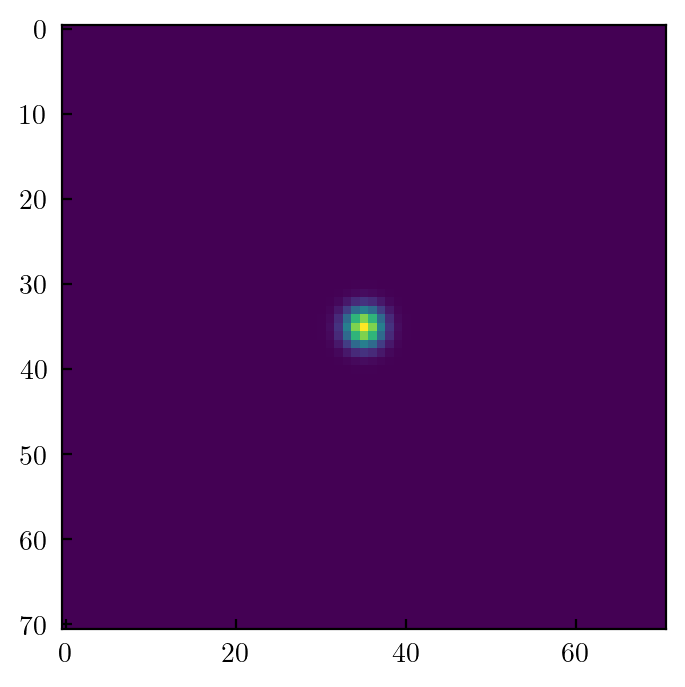

In [7]:
psf_nosmooth_r = np.zeros_like(img_r)
psf_nosmooth_r[dist2cent < 1] = 1

psf_nosmooth_g = np.zeros_like(img_r)
psf_nosmooth_g[dist2cent <= fwhm_pix_g] = 1

psf_model_r = gaussian_filter(psf_nosmooth_r, sigma=std_psf_r)
#psf_model_r = psf_nosmooth_r.copy()

psf_model_g = gaussian_filter(psf_nosmooth_g, sigma=std_psf_g)

plt.imshow(psf_model_r)

0.10375523033473688 0.10375523033473688


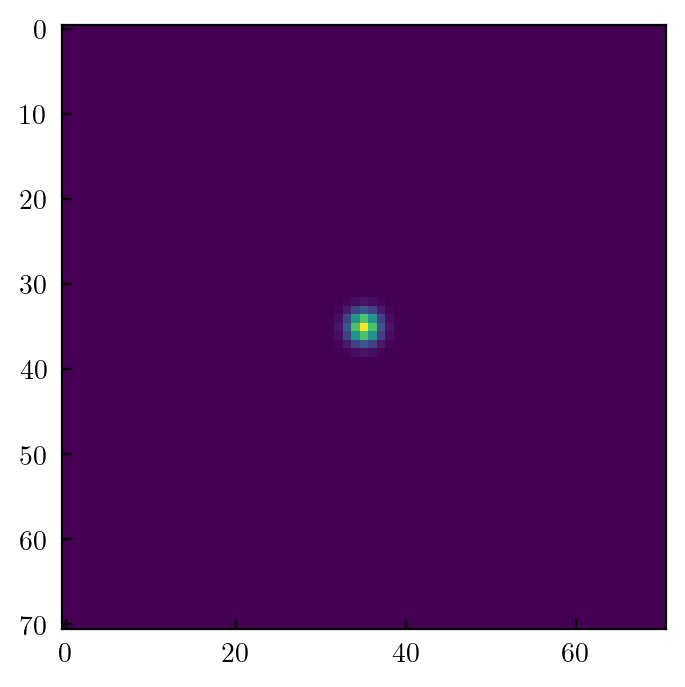

In [8]:
from scipy.stats import multivariate_normal

psf_model_dist_r = multivariate_normal((np.array([nrow, ncol])-1)/2, np.full(2, std_psf_r))

x, y = np.meshgrid(np.arange(ncol), np.arange(nrow))
pos = np.dstack((x, y))
#fig2 = plt.figure(figsize=(6,6))
#ax2 = fig2.add_subplot(111)
#ax2.contourf(x, y, psf_model_r.pdf(pos))

psf_model_r = psf_model_dist_r.pdf(pos)
print(psf_model_dist_r.pdf(pos).max(), psf_model_dist_r.pdf([35,35]))

plt.imshow(psf_model_r)

In [9]:
model_desc = pyimfit.SimpleModelDescription()
# define the limits on the central-coordinate X0 and Y0 as +/-10 pixels relative to initial values
# (note that Imfit treats image coordinates using the IRAF/Fortran numbering scheme: the lower-left
# pixel in the image has coordinates (x,y) = (1,1))
model_desc.x0.setValue(nrow/2, [nrow/2 - 3,nrow/2 + 3])
model_desc.y0.setValue(ncol/2, [ncol/2 - 3,ncol/2 + 3])

# create a Sersic image function, then define the parameter initial values and limits
lrg = pyimfit.make_imfit_function("Sersic", label="LRG")

lrg.I_e.setValue(100.0, [1e-3, 300])
lrg.r_e.setValue(5, [1e-3, 50])
lrg.n.setValue(1, [0.5, 10])

lrg.PA.setValue(40, [0, 180])
lrg.ell.setValue(0.5, [0,1])

model_desc.addFunction(lrg)

print(model_desc)

X0		35.5		32.5,38.5
Y0		35.5		32.5,38.5
FUNCTION Sersic   # LABEL LRG
PA		40.0		0.0,180.0
ell		0.5		0.0,1.0
n		1.0		0.5,10.0
I_e		100.0		0.001,300.0
r_e		5.0		0.001,50.0



In [10]:
imfit_fitter = pyimfit.Imfit(model_desc, psf=psf_model_r)
imfit_fitter.loadData(maskedimg_r, error=stds_r, error_type="sigma")
#imfit_fitter.loadData(test_gal_r, gain=4.72, read_noise=1.15, original_sky=124.94)

In [11]:
results = imfit_fitter.doFit(getSummary=True)

In [12]:
p_bestfit = results.params
print(results)

print("Best-fitting parameter values:")
for i in range(len(p_bestfit) - 1):
    print("{0:g}".format(p_bestfit[i]), end=", ")
print("{0:g}\n".format(p_bestfit[-1]))

            aic: 1975.0399405994865
            bic: 2020.6952057487185
   fitConverged: True
        fitStat: 1961.0176874701401
 fitStatReduced: 0.3895545664422209
          nIter: 11
      paramErrs: array([0.06603462, 0.07944166, 0.        , 0.0309544 , 0.09611912,
       1.35337592, 0.15397097])
         params: array([35.48673096, 35.16599226,  0.        ,  0.19074919,  1.21853974,
       21.32751325,  4.42555776])
     solverName: 'LM'
Best-fitting parameter values:
35.4867, 35.166, 0, 0.190749, 1.21854, 21.3275, 4.42556



In [13]:
results = imfit_fitter.doFit(getSummary=True)
p_bestfit = results.params
print(p_bestfit)

print("Best-fitting parameter values:")
for i in range(len(p_bestfit) - 1):
    print("{0:g}".format(p_bestfit[i]), end=", ")
print("{0:g}\n".format(p_bestfit[-1]))

[35.48671807 35.1659774   0.          0.19075136  1.21850956 21.32770311
  4.42556132]
Best-fitting parameter values:
35.4867, 35.166, 0, 0.190751, 1.21851, 21.3277, 4.42556



In [14]:
np.concatenate((p_bestfit[:-2], p_bestfit[-1:], [p_bestfit[-3], p_bestfit[-1]]))

array([35.48671807, 35.1659774 ,  0.        ,  0.19075136,  1.21850956,
        4.42556132,  1.21850956,  4.42556132])

In [15]:
bestfit_model_im = imfit_fitter.getModelImage(newParameters=p_bestfit)

residual = (img_r - bestfit_model_im) #/ stds_r
print(residual.min())

-7.773523649059865


Text(0.5, 1.0, 'Residual')

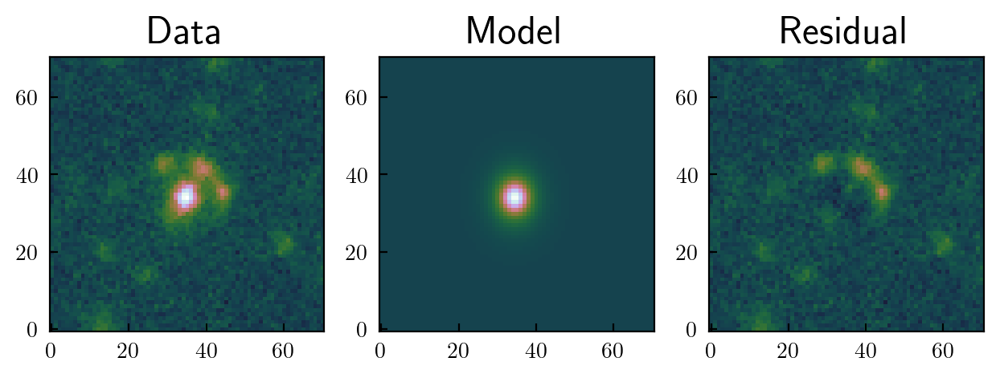

In [16]:
vmin = -20

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7.5, 4.5))
ax1.imshow(img_r, origin='lower', cmap='cubehelix', interpolation='nearest', vmin=vmin, vmax=np.max(img_r))
ax1.set_title('Data', fontsize=18)
ax2.imshow(bestfit_model_im, origin='lower', cmap='cubehelix', interpolation='nearest', vmin=vmin, vmax=np.max(img_r))
ax2.set_title('Model', fontsize=18)
ax3.imshow(residual, origin='lower', cmap='cubehelix', interpolation='nearest', vmin=vmin, vmax=np.max(img_r))
ax3.set_title('Residual', fontsize=18)

Everything else past this point is pretty random.

### Testing with MCMC

In [10]:
class SersicMCMC:

    def __init__(self, img_r, img_g, desid, std_psf_r, std_psf_g, num=3):
    
        self.img_r = img_r
        self.img_g = img_g
        
        self.desid = desid
        
        self.std_psf_r = std_psf_r
        self.std_psf_g = std_psf_g
        
        self.nrow, self.ncol = self.img_r.shape
        
        self.params = ['x_{0}', 'y_{0}', '\\theta', 'E'
                       , 'n_{r}', 'R_{1/2, r}'
                       , 'n_{g}', 'R_{1/2, g}']
        
        # bounds on posterior PDF sampling
        self.Ie_bounds = [1e-3, 300];
        self.r_bounds = [0.1, 30];
        self.n_bounds = [0.2, 8];
        self.x_bounds = [self.ncol/2 - 3, self.ncol/2 + 3];
        self.y_bounds = [self.nrow/2 - 3, self.nrow/2 + 3];
        self.e_bounds = [0, 1];
        self.th_bounds = [0, 180]
        
        self.Iemin, self.Iemax = self.Ie_bounds.copy();
        self.rmin, self.rmax = self.r_bounds.copy();
        self.nmin, self.nmax = self.n_bounds.copy();
        self.x0min, self.x0max = self.x_bounds.copy();
        self.y0min, self.y0max = self.y_bounds.copy();
        self.emin, self.emax = self.e_bounds.copy();
        self.thmin, self.thmax = self.th_bounds.copy()
        
        self.psf_r, self.psf_g = self.construct_psfs()
        
        img_gal_r, stds_r = self.get_img_uncertainties(self.img_r)
        self.img_gal_r = img_gal_r; self.stds_r = stds_r
        
        img_gal_g, stds_g = self.get_img_uncertainties(self.img_g)
        self.img_gal_g = img_gal_g; self.stds_g = stds_g
        
        masked_img_gal_r, masked_img_gal_g = self.create_mask(num=num)
        
        self.img_gal_r = masked_img_gal_r
        self.img_gal_g = masked_img_gal_g

    def construct_psfs(self):
        '''
        take the given full widths at half maximum in r&g bands and
        creates a pair of model PSF images
        
        these go on to be convolved with the model brightness profiles
        '''
        
        x, y = np.meshgrid(np.arange(self.ncol), np.arange(self.nrow))
        pos = np.dstack((x, y))
        
        # r band
        
        psf_dist_r = multivariate_normal((np.array([self.nrow, self.ncol])-1)/2
                                               , np.full(2, self.std_psf_r))

        psf_r = psf_dist_r.pdf(pos)
        
        # g band
        
        psf_dist_g = multivariate_normal((np.array([self.nrow, self.ncol])-1)/2
                                               , np.full(2, self.std_psf_g))

        psf_g = psf_dist_g.pdf(pos)
        
        return psf_r, psf_g 
    
    def get_img_uncertainties(self, img_i, num=1.0):
        '''

        a function that estimates uncertainties in the pixel values of redmagic 
        images, both from background and from the elliptical galaxy
    
        also returns the grid of I_gal values, which is what the Sérsic model is fit to
    
        inputs:
        --------
    
        img        ---    2D array; a DES redMaGiC image with an elliptical galaxy that a Sérsic
                          model is being fit to  
    
        outputs:
        --------
    
        img_gal    ---    2D array; alternatively img_gal_copy (explained below); the grid of I_gal values
                          calculated from estimation of a constant I_bg
    
        std_arr    ---    2D array; grid of uncertainties in corresponding pixel values from the DES image
  
        '''
    
        sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    
        bg_pixels = sigma_clip(img_i, masked=False, axis=None)
    
        ## I_bg and std_bg
    
        img_bg = np.mean(bg_pixels)  # I_bg
    
        bkgrms = StdBackgroundRMS(sigma_clip)
        std_bg = bkgrms(img_i) 
    
        ## I_gal
    
        img_gal = img_i - img_bg          # I_tot = I_gal + I_bg
    
        std_gal = np.sqrt(num * img_gal) 
    
        invalid_sgal_ind = (std_gal == np.inf) | (std_gal == -np.inf)
        std_gal[invalid_sgal_ind] = 0
    
        std_gal = np.nan_to_num(std_gal)
    
        ## estimate uncertainties

        std_arr = np.sqrt(std_gal**2 + std_bg**2)

        return img_gal, std_arr
    
    def create_mask(self, num=3):
        '''
        Takes a raw input fits image and constructs a mask to filter out light 
        from other sources apart from the lens/galaxy. Returns the masked image,
        where pixel values from other sources are set to 0.
    
        '''
    
        # construct a background image w/ background noise
        bkg = Background2D(self.img_g, box_size=5)
        bkg_img = bkg.background
    
        # calculate RMS of each pixel, used to calculate threshold for source identification
        sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
        bkgrms = StdBackgroundRMS(sigma_clip)
        bkgrms_img = bkgrms(self.img_g) 

        # map of thresholds over which sources are detected
        threshold = bkg_img + (0.5 * bkgrms_img)  
    
        # source detection
        sigma = 3.0 * gaussian_fwhm_to_sigma  # FWHM = 3.
        kernel = Gaussian2DKernel(sigma, x_size=3, y_size=3).normalize()
        segm = detect_sources(self.img_g, threshold, 5, kernel)
    
        # deblending sources, looking for saddles between peaks in flux
        segm_deblend = deblend_sources(self.img_g, segm, npixels=5,
                                       nlevels=32, contrast=0.001)
                
        label = segm_deblend.data[(segm_deblend.data.shape[0]//2, segm_deblend.data.shape[1]//2)]
        other_inds = np.delete(np.arange(1, segm_deblend.nlabels+1), label-1)
    
        deblend_copy = segm_deblend.data.copy()
        source = (deblend_copy == label)
    
        # get pixels from all other sources
        deblend_copy2 = segm_deblend.copy()
        deblend_copy2.keep_labels(other_inds)

        segm_dilated_arr = maximum_filter(deblend_copy2.data, num)
        segm_dilated_arr[deblend_copy2.data != 0] = deblend_copy2.data[deblend_copy2.data != 0]
        
        # label central source, which is the lens/galaxy
        segm_dilated_arr[source] = 10000
    
        segm_dilated = SegmentationImage(segm_dilated_arr)
    
        other_inds = np.delete(segm_dilated.labels, -1)
        
        # get pixels from all other sources
        segm_dilated.keep_labels(other_inds)
    
        self.mask = (segm_dilated.data > 0)

        # make values of those pixels 0 in both img_gal and uncertainties
        gal_copy_g = self.img_gal_g.copy()
        gal_copy_g[self.mask] = 0
        gal_copy_r = self.img_gal_r.copy()
        gal_copy_r[self.mask] = 0
    
        return gal_copy_r, gal_copy_g
    
    def quick_fit(self, npop=25):
        '''
        makes a quick fit using imfit, used to find initial vector for MCMC
        '''
        
        ### r-band
        
        model_desc_r = pyimfit.SimpleModelDescription()
        
        # define the limits on the central-coordinate X0 and Y0 as +/-10 pixels relative to initial values
        # (note that Imfit treats image coordinates using the IRAF/Fortran numbering scheme: the lower-left
        # pixel in the image has coordinates (x,y) = (1,1))
        model_desc_r.x0.setValue(self.nrow/2, self.x_bounds)
        model_desc_r.y0.setValue(self.ncol/2, self.y_bounds)

        # create a Sersic image function, then define the parameter initial values and limits
        lrg_r = pyimfit.make_imfit_function("Sersic", label="LRG_r")

        lrg_r.I_e.setValue(80, self.Ie_bounds)
        lrg_r.r_e.setValue(5, self.r_bounds)
        lrg_r.n.setValue(1, self.n_bounds)

        lrg_r.PA.setValue(40, self.th_bounds)
        lrg_r.ell.setValue(0.5, self.e_bounds)
        
        model_desc_r.addFunction(lrg_r)
        
        self.imfit_r = pyimfit.Imfit(model_desc_r, psf=self.psf_r)
        self.imfit_r.loadData(self.img_gal_r, error=self.stds_r, error_type="sigma")

        results_r = self.imfit_r.doFit(getSummary=True)
        bestfit_r = results_r.params
        
        ### g-band
        
        model_desc_g = pyimfit.SimpleModelDescription()
        
        # define the limits on the central-coordinate X0 and Y0 as +/-10 pixels relative to initial values
        # (note that Imfit treats image coordinates using the IRAF/Fortran numbering scheme: the lower-left
        # pixel in the image has coordinates (x,y) = (1,1))
        model_desc_g.x0.setValue(self.nrow/2, self.x_bounds)
        model_desc_g.y0.setValue(self.ncol/2, self.y_bounds)

        # create a Sersic image function, then define the parameter initial values and limits
        lrg_g = pyimfit.make_imfit_function("Sersic", label="LRG_r")

        lrg_g.I_e.setValue(30, self.Ie_bounds)
        lrg_g.r_e.setValue(5, self.r_bounds)
        lrg_g.n.setValue(1, self.n_bounds)

        lrg_g.PA.setValue(40, self.th_bounds)
        lrg_g.ell.setValue(0.5, self.e_bounds)
        
        model_desc_g.addFunction(lrg_g)
        
        self.imfit_g = pyimfit.Imfit(model_desc_g, self.psf_g)
        self.imfit_g.loadData(self.img_gal_g, error=self.stds_g, error_type="sigma")

        results_g = self.imfit_g.doFit(getSummary=True)
        bestfit_g = results_g.params
        
        print('r band:\n', results_r)
        print('\ng band:\n', results_g)
    
        return bestfit_r, bestfit_g
        
    def log_priors(self, v):
        '''
        all priors are taken to be uniform distributions
        '''
    
        x0, y0, th, e, nr, rr, ng, rg = v
        
        if ((self.rmin <= rr <= self.rmax) and (self.nmin <= nr <= self.nmax)                   # r-band
            and (self.rmin <= rg <= self.rmax) and (self.nmin <= ng <= self.nmax)               # g-band
            and (self.x0min <= x0 <= self.x0max) and (self.y0min <= y0 <= self.y0max) 
            and (self.emin <= e <= self.emax) and (self.thmin <= th <= self.thmax)):
        
            lnprior = 0
            
        else:
        
            lnprior = -np.inf
            
        return lnprior
       
    def log_likelihood(self, v):
    
        self.x0, self.y0, self.th, self.e, self.nr, self.rr, self.ng, self.rg = v
    
        ## initialize Sersic profiles
        
        # r-band
        
        new_params_r = np.array([self.x0, self.y0, self.th, self.e, self.nr, 1.0, self.rr])
    
        norm_profile_r = self.imfit_r.getModelImage(newParameters=new_params_r)
        
        # g-band
        
        new_params_g = np.array([self.x0, self.y0, self.th, self.e, self.ng, 1.0, self.rg])
    
        norm_profile_g = self.imfit_g.getModelImage(newParameters=new_params_g)
    
        ## find amplitudes, then multiply by I'
        
        # r-band
        Ie_r = np.sum((norm_profile_r * (self.img_gal_r)) / (self.stds_r)**2) / np.sum((norm_profile_r)**2 / (self.stds_r)**2)
    
        profile_r = Ie_r * norm_profile_r
        
        # g-band
        Ie_g = np.sum((norm_profile_g * (self.img_gal_g)) / (self.stds_g)**2) / np.sum((norm_profile_g)**2 / (self.stds_g)**2)
    
        profile_g = Ie_g * norm_profile_g
    
        # 1/sqrt(2.*pi) factor can be omitted from the likelihood because it does not depend on model parameters
        # there are two terms for two bands
        return np.sum(-0.5 * (np.log(self.stds_r**2) + (self.img_gal_r - profile_r)**2 / self.stds_r**2)) + np.sum(-0.5 * (np.log(self.stds_g**2) + (self.img_gal_g - profile_g)**2 / self.stds_g**2))
        
    def log_posterior(self, v):
    
        # find values in prior and likelihood pdfs
        logprior = self.log_priors(v)
        loglike = self.log_likelihood(v)
    
        logpost = logprior + loglike
    
        if np.isnan(logpost):
            logpost = -np.inf
    
        return logpost
    
    def mcmc_run(self, ndim=8, nwalkers=25, steps=1250):
        
        fit_r, fit_g = self.quick_fit()
        
        init_fit = np.concatenate((fit_r[:-2], fit_r[-1:], [fit_g[-3], fit_g[-1]]))
        
        # initial vector
        # use np.random.normal instead, and center around min_v, small std
        size = ndim * nwalkers
        pr = np.random.normal(loc=0, scale=0.01, size=size).reshape((nwalkers, ndim)) + init_fit
        sampler = emcee.EnsembleSampler(nwalkers, ndim, self.log_posterior)

        sampler.run_mcmc(pr, steps, progress=True)
        
        samples = sampler.get_chain()
            
        self.samples = samples
        
        self.dist = self.samples[-300:]
        
        return self.samples, self.dist
    
    def plot_trace(self, cutoff = 750, figsize=(5, 1)):
        
        try:
            nsteps, ndims = np.shape(self.samples)[0], np.shape(self.samples)[2]
        except:
            nsteps, ndims = np.shape(self.samples)[0], 1
        
        medians = np.median(self.samples, axis=1)
    
        sig_lb = np.percentile(self.samples, 16, axis=1)
        sig_ub = np.percentile(self.samples, 84, axis=1)
        
        for d in range(ndims):
        
            fig = plt.figure(figsize=figsize)
            ax = fig.add_subplot(111)
    
            ax.set_ylabel(r'${}$'.format(self.params[d])) # label axis 
            ax.set_xlabel(r'step number')
            
            if ndims == 1:
            
                avr = np.mean(medians[-100:])
            
                xl = np.linspace(-50, len(medians)+50, 50)  # average
                yl = 0 * xl + avr
            
                xc = 0 * xl + cutoff
    
                ax.plot(xl, yl, '--', c='r', lw=1.0)
                ax.plot(xc, xl, '--', c='g', lw=1.0)

                ax.set_xlim(-25, len(medians) + 25)
                ax.set_ylim(np.min(medians) * 0.85, np.max(medians) * 1.15)
            
        
                ax.plot(np.arange(0,nsteps,1), medians, alpha=0.75, lw=0.5, c='darkslateblue', label='d={:d}'.format(d))
                ax.fill_between(np.arange(0,nsteps,1), sig_lb, sig_ub, alpha=0.2)
        
            else:
            
                avr = np.mean(medians[:,d][-100:])
                
                xl = np.linspace(-50, len(medians[:,d])+50, 50)
                yl = 0 * xl + avr
            
                xc = 0 * xl + cutoff
    
                ax.plot(xl, yl, '--', c='r', lw=1.0)
                ax.plot(xc, xl, '--', c='g', lw=1.0)

                ax.set_xlim(-25, len(medians[:,d]) + 25)
                ax.set_ylim(np.min(medians[:,d]) * 0.97, np.max(medians[:,d]) * 1.03)
            
                ax.plot(np.arange(0,nsteps), medians[:,d], alpha=0.75, lw=0.75, c='darkblue', label='d={:d}'.format(d))
                ax.fill_between(np.arange(0,nsteps), sig_lb[:,d], sig_ub[:,d], color='darkblue', alpha=0.2)
    
    def plot_raw_profile_rr(self, height=6, width=12, num_r=20, num_g=10):
    
        diff_img_r = (self.img_gal_r - self.profile_r) / self.stds_r
        diff_img_r[self.mask] = 0
        
        diff_img_g = (self.img_gal_g - self.profile_g) / self.stds_g
        diff_img_g[self.mask] = 0
    
        fig, ax = plt.subplots(2,3)
        fig.set_figheight(height)
        fig.set_figwidth(width)

        imgs = np.array([self.img_gal_r, self.profile_r, diff_img_r
                         , self.img_gal_g, self.profile_g, diff_img_g])
    
        imgs_min_r = np.min(imgs[:3], axis=(1,2))
        imgs_max_r = np.max(imgs[:3], axis=(1,2))
        
        # lower bound not 0 if negative pixel values in des images not removed
        cbar_lb_r = np.min(imgs_min_r[:2]) - num_r
        cbar_ub_r = np.max(imgs_max_r[:2])
        
        imgs_min_g = np.min(imgs[3:], axis=(1,2))
        imgs_max_g = np.max(imgs[3:], axis=(1,2))
    
        # lower bound not 0 if negative pixel values in des images not removed
        cbar_lb_g = np.min(imgs_min_g[:2]) - num_g
        cbar_ub_g = np.max(imgs_max_g[:2])

        ax[0, 0].set_title(r'$I_{\rm gal}$, DES ID: ' + self.desid
                        , fontsize=18)
        ax[0, 1].set_title(r'$I(\mathbf{v})$', fontsize=18)
        ax[0, 2].set_title(r'$\left( I_{\rm gal} - I(\mathbf{v}) \right) / \sigma$', fontsize=18)
    
        # r-band
        
        for i, image in enumerate(imgs[:3]):
            
            # Hide grid lines
            ax[0, i].grid(False)

            # Hide axes ticks
            ax[0, i].set_xticks([])
            ax[0, i].set_yticks([])
    
            if i == 2:
                im = ax[0, i].imshow(image, origin='lower', cmap='RdBu', interpolation='nearest'
                              , vmin=-5, vmax=5
                             )
            
                divider = make_axes_locatable(ax[0, i])
                cax = divider.append_axes('right', size='5%', pad=0.05)
                cbar = fig.colorbar(im, cax=cax)
                cbar.set_label('Residual', rotation=270, labelpad=25, fontsize=16)
        
            else:
                im = ax[0, i].imshow(image, origin='lower', cmap='cubehelix', interpolation='nearest'  # cmap = cubehelix, viridis
                              , vmin=cbar_lb_r, vmax=cbar_ub_r
                             )
            
                #divider = make_axes_locatable(ax[0, i])
                #cax = divider.append_axes('right', size='5%', pad=0.05)
                #cbar = fig.colorbar(im, cax=cax)
                #cbar.set_label(r'$r$-band rightness', rotation=270, labelpad=25, fontsize=16)
         
        # g-band
        
        for i, image in enumerate(imgs[3:]):
            
            # Hide grid lines
            ax[1, i].grid(False)

            # Hide axes ticks
            ax[1, i].set_xticks([])
            ax[1, i].set_yticks([])
    
            if i == 2:
                im = ax[1, i].imshow(image, origin='lower', cmap='RdBu', interpolation='nearest'
                              , vmin=-5, vmax=5
                             )
            
                divider = make_axes_locatable(ax[1, i])
                cax = divider.append_axes('right', size='5%', pad=0.05)
                cbar = fig.colorbar(im, cax=cax)
                cbar.set_label('Residual', rotation=270, labelpad=25, fontsize=16)
        
            else:
                im = ax[1, i].imshow(image, origin='lower', cmap='cubehelix', interpolation='nearest'  # cmap = cubehelix, viridis
                              , vmin=cbar_lb_g, vmax=cbar_ub_g
                             )
            
                #divider = make_axes_locatable(ax[1, i])
                #cax = divider.append_axes('right', size='5%', pad=0.05)
                #cbar = fig.colorbar(im, cax=cax)
                #cbar.set_label(r'$g$-band brightness', rotation=270, labelpad=25, fontsize=16)
        
    def get_medians_calc_amplitude(self):
    
        self.medians = np.array([])

        for i in range(self.dist.shape[2]):
    
            gs1d = self.dist[:,:,i]
    
            gs1d_con = np.concatenate(gs1d)

            mid = np.median(gs1d_con)
    
            self.medians = np.append(self.medians, mid)

        x0i, y0i, thi, ei, nri, rri, ngi, rgi = self.medians.copy()
    
        ## initialize Sersic profiles
        
        # r-band
        
        new_params_r = np.array([x0i, y0i, thi, ei, nri, 1.0, rri])
    
        self.norm_profile_r = self.imfit_r.getModelImage(newParameters=new_params_r)
    
        # find amplitude
        self.Ie_r = np.sum((self.norm_profile_r * self.img_gal_r) / (self.stds_r)**2) / np.sum((self.norm_profile_r)**2 / (self.stds_r)**2)
        
        # g-band
        
        new_params_g = np.array([x0i, y0i, thi, ei, ngi, 1.0, rgi])
        
        self.norm_profile_g = self.imfit_g.getModelImage(newParameters=new_params_g)
    
        # find amplitude
        self.Ie_g = np.sum((self.norm_profile_g * self.img_gal_g) / (self.stds_g)**2) / np.sum((self.norm_profile_g)**2 / (self.stds_g)**2)
    
        return np.append([self.Ie_r, self.Ie_g], self.medians) 
    
    def plot_gal(self, height=6, width=12, num_r=20, num_g=10):
        
        print('----------------------------\n')

        results = self.get_medians_calc_amplitude()
        
        self.Ie_r = results[0]; self.Ie_g = results[1]
        self.medians = results[2:]

        self.x0_med, self.y0_med, self.th_med, self.e_med, self.nr_med, self.rr_med, self.ng_med, self.rg_med = self.medians.copy()
        
        final_params_r = np.array([self.x0_med, self.y0_med, self.th_med, self.e_med, self.nr_med, self.Ie_r, self.rr_med])
        
        self.profile_r = self.imfit_r.getModelImage(newParameters=final_params_r)
        
        final_params_g = np.array([self.x0_med, self.y0_med, self.th_med, self.e_med, self.ng_med, self.Ie_g, self.rg_med])
        
        self.profile_g = self.imfit_g.getModelImage(newParameters=final_params_g)
        
        self.plot_raw_profile_rr(height=height, width=width, num_r=num_r, num_g=num_g)

In [18]:
thing = np.arange(8)
np.concatenate((thing[:-4], thing[-2:]))

array([0, 1, 2, 3, 6, 7])

In [20]:
test_img_r = read_fits_image(os.path.join(jr_path, 'DESJ000729.2824-443446.1640_r.fits'))
test_img_g = read_fits_image(os.path.join(jg_path, 'DESJ000729.2824-443446.1640_g.fits'))
#test_img_r = read_fits_image('/Users/aidan/Downloads/DESJ031253.9220-130825.4832_r.fits')
#test_img_g = read_fits_image('/Users/aidan/Downloads/DESJ031253.9220-130825.4832_g.fits')

desid = 'DES04500-57'
#desid = 'DESJ0312-13'

test = SersicMCMC(img_r = test_img_r, img_g = test_img_g
                  , std_psf_r = std_psf_r, std_psf_g = std_psf_g
                  , desid = desid, num=3)

/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:115: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:115: RuntimeWarning: invalid value encountered in sqrt


r band:
             aic: 1937.3339567961636
            bic: 1982.9892219453957
   fitConverged: True
        fitStat: 1923.3117036668173
 fitStatReduced: 0.38206430346976905
          nIter: 9
      paramErrs: array([0.03418136, 0.0353168 , 0.        , 0.01436297, 0.03966781,
       1.76710583, 0.06701578])
         params: array([3.53953884e+01, 3.60610842e+01, 0.00000000e+00, 5.58013456e-02,
       1.32001801e+00, 6.87518148e+01, 4.85001111e+00])
     solverName: 'LM'

g band:
             aic: 1429.4162687087655
            bic: 1475.0715338579976
   fitConverged: True
        fitStat: 1415.3940155794191
 fitStatReduced: 0.2811668684106911
          nIter: 10
      paramErrs: array([ 0.09494792,  0.09322787, 10.82982806,  0.03607009,  0.08849448,
        0.89222018,  0.1709802 ])
         params: array([3.52783718e+01, 3.59689085e+01, 1.35970663e+02, 1.01985602e-01,
       1.02678535e+00, 1.41013419e+01, 4.75323130e+00])
     solverName: 'LM'


  0%|          | 0/1000 [00:00<?, ?it/s]/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 1000/1000 [02:36<00:00,  6.38it/s]


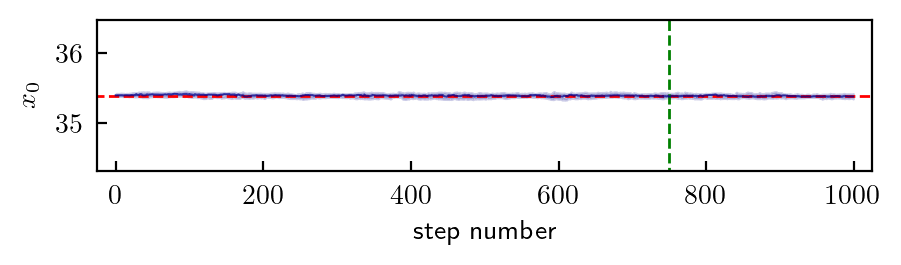

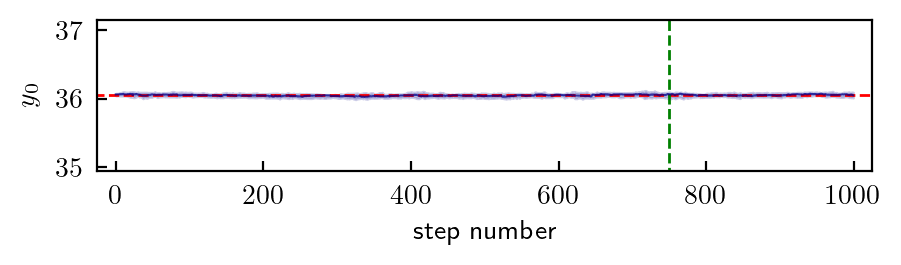

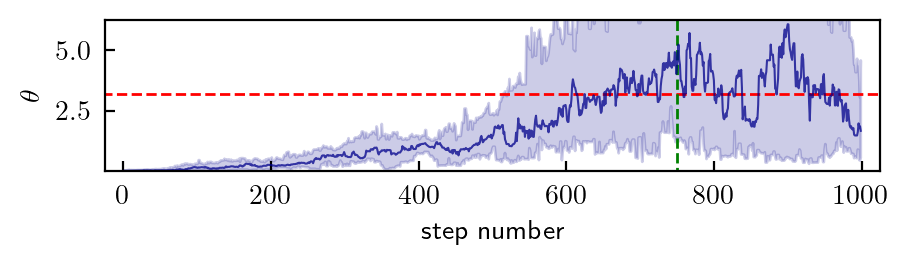

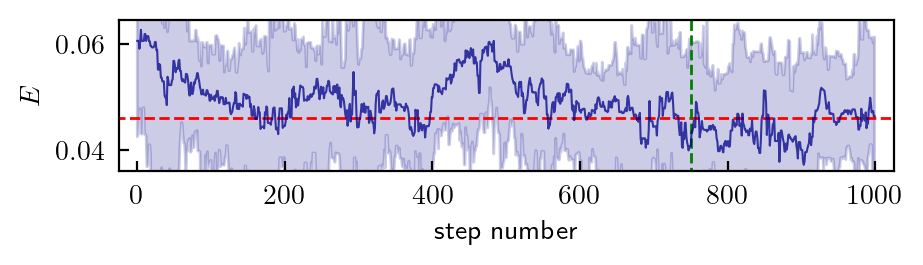

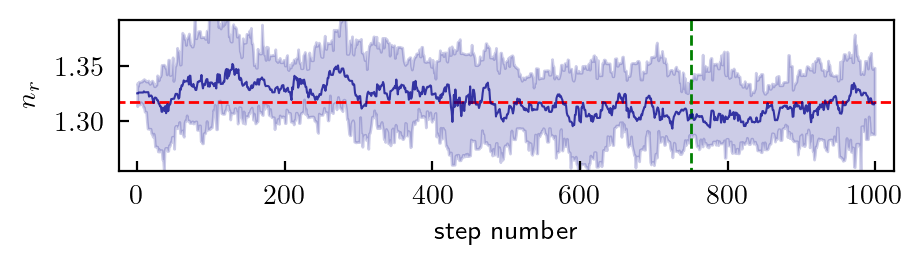

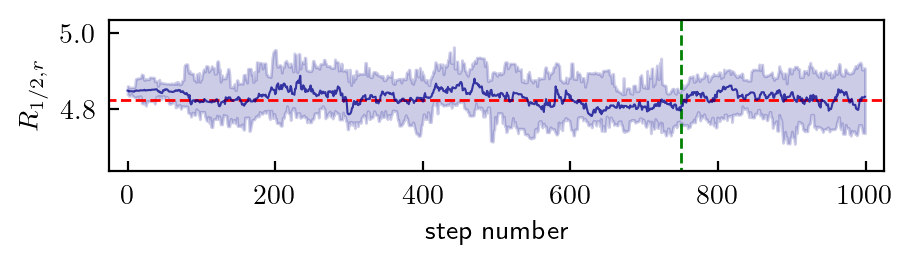

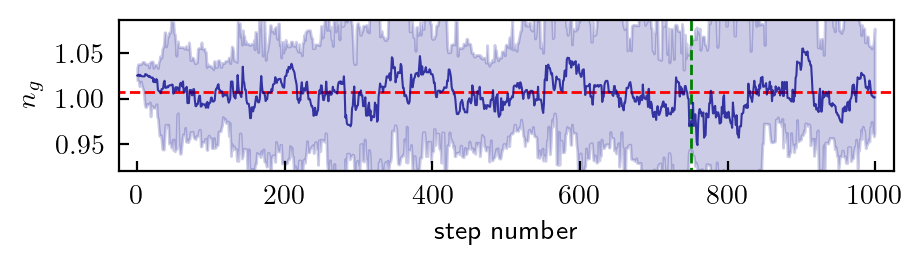

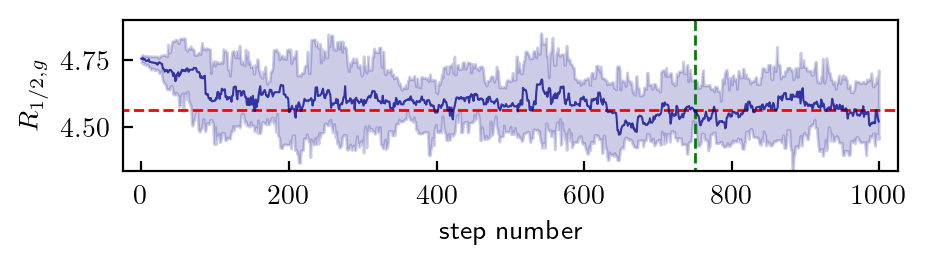

In [21]:
run, dist = test.mcmc_run(nwalkers=20, steps=1000)
    
test.plot_trace()

----------------------------



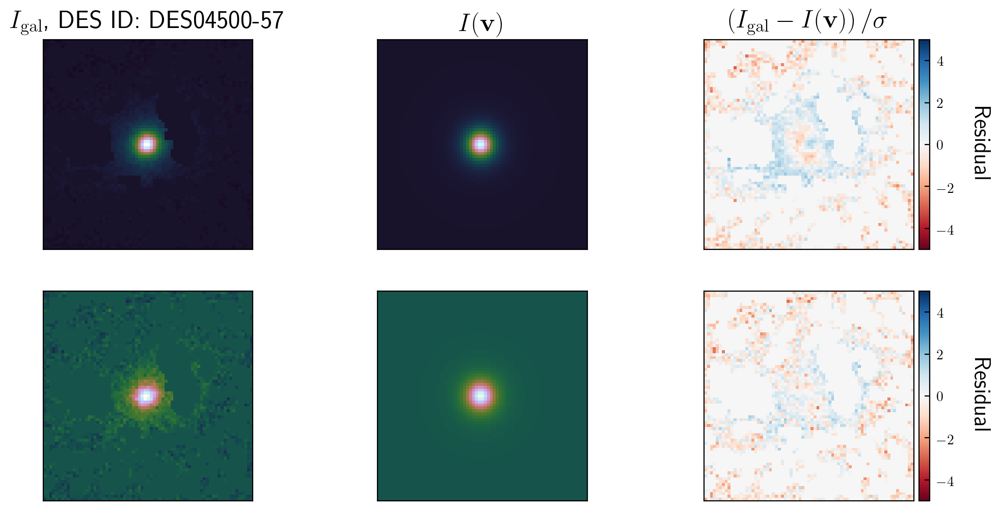

In [22]:
# plot model result

test.plot_gal()

### SExtractor

In [182]:
import sep

In [183]:
jr_path = '/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/rband_dr2/filt/'
jg_path = '/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/gband_dr2/filt/'

files = np.array(os.listdir(jr_path))
finds = [i for i, f in enumerate(files) if 'DESJ' in f]
files_r = files[finds]

files = np.array(os.listdir(jg_path))
finds = [i for i, f in enumerate(files) if 'DESJ' in f]
files_g = files[finds]

In [185]:
index = 5

filename_r = os.path.join(jr_path, files_r[index])
filename_g = os.path.join(jg_path, files_g[index])

test_r = read_fits_image(filename_r)
test_g = read_fits_image(filename_g)

print(filename_r)

test_gal_r, stds_r = get_img_uncertainties(test_r)
test_gal_g, stds_g = get_img_uncertainties(test_g)

/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/rband_dr2/filt/DESJ051012.7944-323205.7120_r.fits


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt


In [186]:
test_g_swap = test_g.byteswap(inplace=True).newbyteorder()

bkg_g = sep.Background(test_g_swap)

sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
bkgrms = StdBackgroundRMS(sigma_clip)

objects = sep.extract(test_gal_g, 10, err=bkg_g.globalrms)

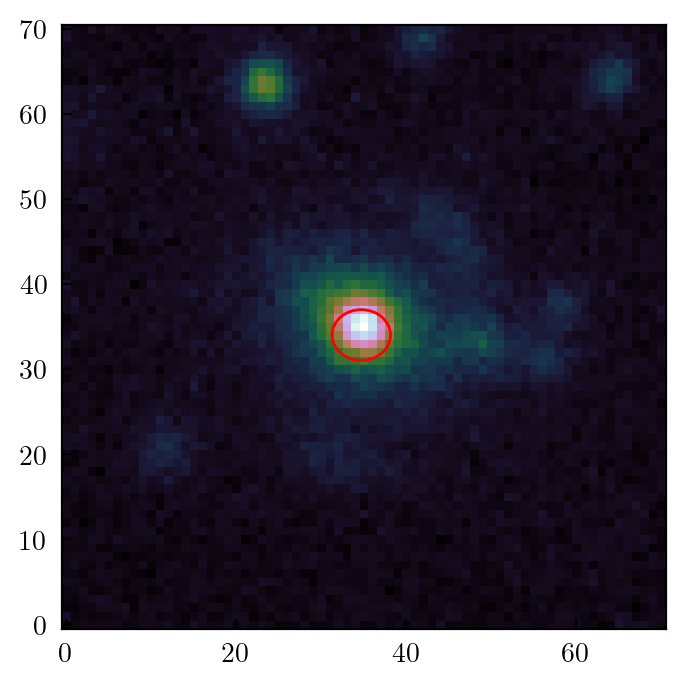

In [188]:
from matplotlib.patches import Ellipse

# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(test_gal_g), np.std(test_gal_g)
im = ax.imshow(test_gal_r, interpolation='nearest', cmap='cubehelix',
               vmin=-10, vmax=np.max(test_gal_r), origin='lower')

# plot an ellipse for each object
for i in range(len(objects)):
    e = Ellipse(xy=(objects['x'][i], objects['y'][i]),
                width=6*objects['a'][i],
                height=6*objects['b'][i],
                angle=objects['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)

### Playing with Masking Function

In [17]:
jr_path = '/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/rband_dr2/no_cluster_scale/'
jg_path = '/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/gband_dr2/no_cluster_scale/'

files = np.array(os.listdir(jr_path))
finds = [i for i, f in enumerate(files) if 'DESJ' in f]
files_r = sorted(files[finds])

files = np.array(os.listdir(jg_path))
finds = sorted([i for i, f in enumerate(files) if 'DESJ' in f])
files_g = sorted(files[finds])

In [300]:
index = 5

filename_r = os.path.join(jr_path, files_r[index])
filename_g = os.path.join(jg_path, files_g[index])

test_r = read_fits_image(filename_r)
test_g = read_fits_image(filename_g)

print(filename_r)

test_obj = SersicMCMC(img_r = test_r, img_g = test_g
                  , std_psf_r = std_psf_r, std_psf_g = std_psf_g
                  , desid = '0', num=3)

#test_obj.create_mask()

/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/rband_dr2/no_cluster_scale/DESJ001153.1240-461421.9120_r.fits


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:115: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:115: RuntimeWarning: invalid value encountered in sqrt


In [34]:
def plot_mask(test_obj, mask, index, desid, vmin=-15):
    
    masked_gal = test_obj.copy()
    masked_gal[mask] = -100

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7.5, 4.5))
    ax1.imshow(test_obj, origin='lower', cmap='cubehelix', interpolation='nearest', vmin=vmin, vmax=np.max(test_obj))
    ax1.set_title('Before Masking, ind = {}'.format(index), fontsize=18)
    ax2.imshow(masked_gal, origin='lower', cmap='cubehelix', interpolation='nearest', vmin=vmin, vmax=np.max(masked_gal))
    ax2.set_title('After Masking, ID: {}'.format(desid), fontsize=18)

    # Hide axes ticks
    for ax in (ax1, ax2):
        ax.set_xticks([])
        ax.set_yticks([])

In [241]:
def create_mask(img_g, img_r, img_gal, num=3, box_num=5, mult = 0.5, npix=5):
    '''
    Takes a raw input fits image and constructs a mask to filter out light 
    from other sources apart from the lens/galaxy. Returns the masked image,
    where pixel values from other sources are set to 0.
    
    '''
    
    # construct a background image w/ background noise
    bkg = Background2D(img_g, box_size=box_num)
    bkg_img = bkg.background
    
    # calculate RMS of each pixel, used to calculate threshold for source identification
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    bkgrms = StdBackgroundRMS(sigma_clip)
    bkgrms_img = bkgrms(img_g) 

    # map of thresholds over which sources are detected
    threshold = bkg_img + (mult * bkgrms_img)  
    
    # source detection
    sigma = 3.0 * gaussian_fwhm_to_sigma  # FWHM = 3.
    kernel = Gaussian2DKernel(sigma, x_size=3, y_size=3).normalize()
    
    segm_g = detect_sources(img_g, threshold, npix, kernel)
    segm_r = detect_sources(img_r, threshold, npix, kernel)
    
    # deblending sources, looking for saddles between peaks in flux
    segm_deblend_g = deblend_sources(img_g, segm_g, npixels=5,
                                       nlevels=32, contrast=1e-3)
    segm_deblend_r = deblend_sources(img_r, segm_r, npixels=5,
                                       nlevels=32, contrast=1e-3)
    
    label = segm_deblend_r.data[(segm_deblend_r.data.shape[0]//2, segm_deblend_r.data.shape[1]//2)]
    other_inds_r = np.delete(np.arange(1, segm_deblend_r.nlabels+1), label-1)
    
    label = segm_deblend_g.data[(segm_deblend_g.data.shape[0]//2, segm_deblend_g.data.shape[1]//2)]
    other_inds_g = np.delete(np.arange(1, segm_deblend_g.nlabels+1), label-1)
    
    source = (segm_deblend_g.data == label)
    
    # get pixels from all other sources
    deblend_copy = segm_deblend_g.copy()
    deblend_copy.keep_labels(other_inds_g)
    
    segm_deblend_r.keep_labels(other_inds_r)
    
    ## find a way to also remove sources identified in the r band image, 
    ## set those pixels to 0 as well
    
    segm_dilated_arr_r = maximum_filter(segm_deblend_r.data, num)
    segm_dilated_arr_r[segm_deblend_r.data != 0] = segm_deblend_r.data[segm_deblend_r.data != 0]

    segm_dilated_arr_g = maximum_filter(deblend_copy.data, num)
    segm_dilated_arr_g[deblend_copy.data != 0] = deblend_copy.data[deblend_copy.data != 0]
        
    # label central source, which is the lens/galaxy
    segm_dilated_arr_r[source] = 10000
    segm_dilated_arr_g[source] = 10000
    
    segm_dilated_r = SegmentationImage(segm_dilated_arr_r)
    segm_dilated_g = SegmentationImage(segm_dilated_arr_g)
    
    other_inds_r = np.delete(segm_dilated_r.labels, -1)
    other_inds_g = np.delete(segm_dilated_g.labels, -1)
        
    # get pixels from all other sources
    segm_dilated_r.keep_labels(other_inds_r)
    segm_dilated_g.keep_labels(other_inds_g)
    
    nonzeros = ((segm_dilated_g.data > 0) 
                #| (segm_dilated_r.data > 0)
               )

    # make values of those pixels 0 in both img_gal and uncertainties
    gal_copy = img_gal.copy()
    gal_copy[nonzeros] = 0
    
    return gal_copy, nonzeros

DESJ2118-43


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt


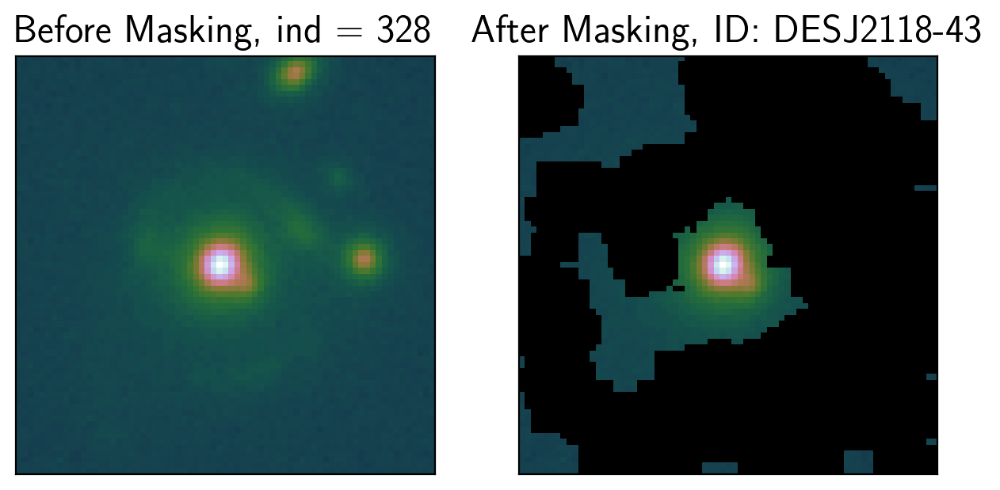

In [239]:
test_r = read_fits_image('/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/rband_dr2/DESJ234930.0552-511339.0360_r.fits')
test_g = read_fits_image('/Users/aidan/Desktop/sl_project/datasets/sl_jacobs/gband_dr2/DESJ234930.0552-511339.0360_g.fits')
    
split = filename_r.split('/')[9].split('.')
    
desid = split[0][:-2] + split[1][4:7]

print(desid)
    
test_gal_g, stds_g = get_img_uncertainties(test_r)

masked_gal, mask = create_mask(test_g, test_r, test_gal_g
                                , num=4, box_num=10
                                , mult=0.5, npix=25
                              )
    
plot_mask(test_r, mask
          , index=i, desid=desid
          , vmin=-100
        )

DESJ0015-46
DESJ0015-02


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt


DESJ0018-45
DESJ0019-41


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt


DESJ0021-40
DESJ0024-34


/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt


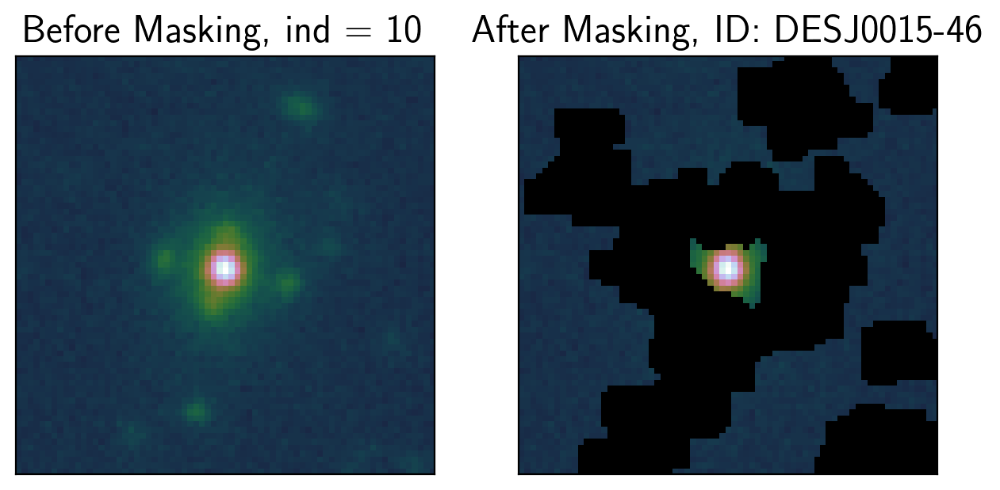

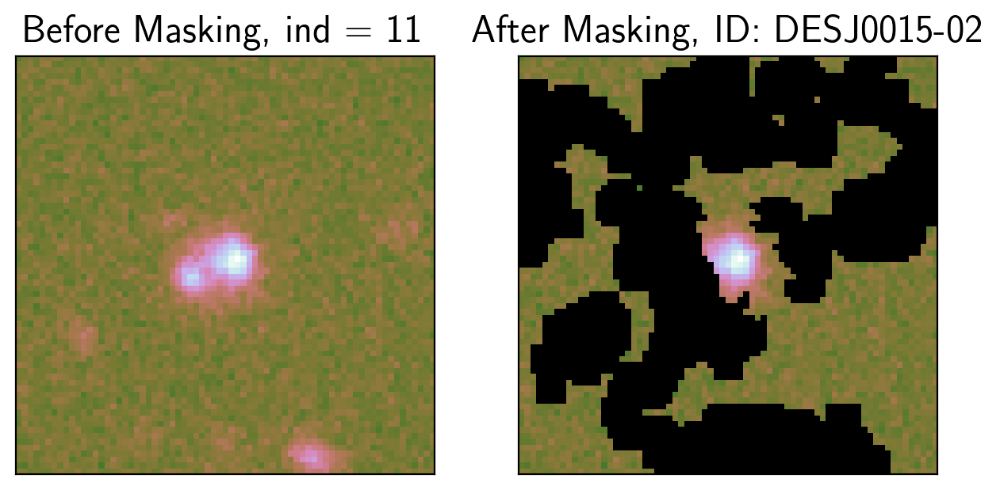

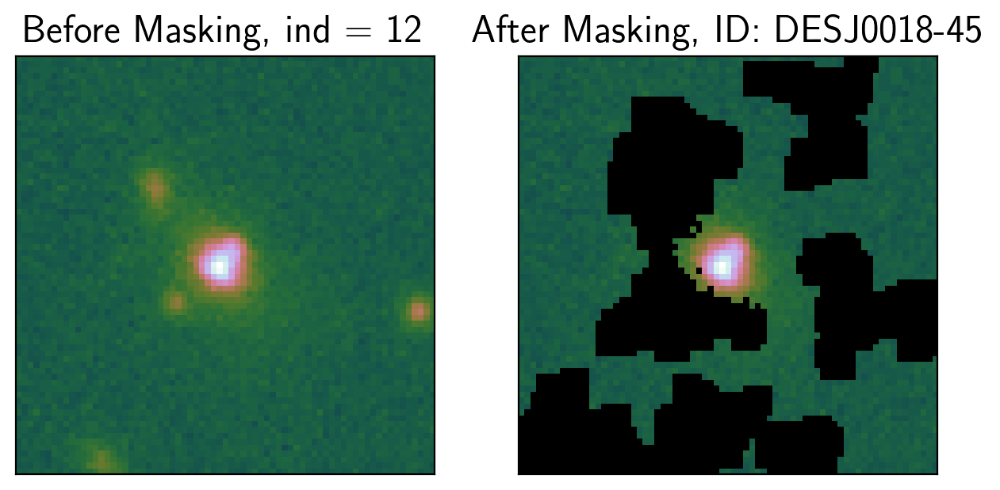

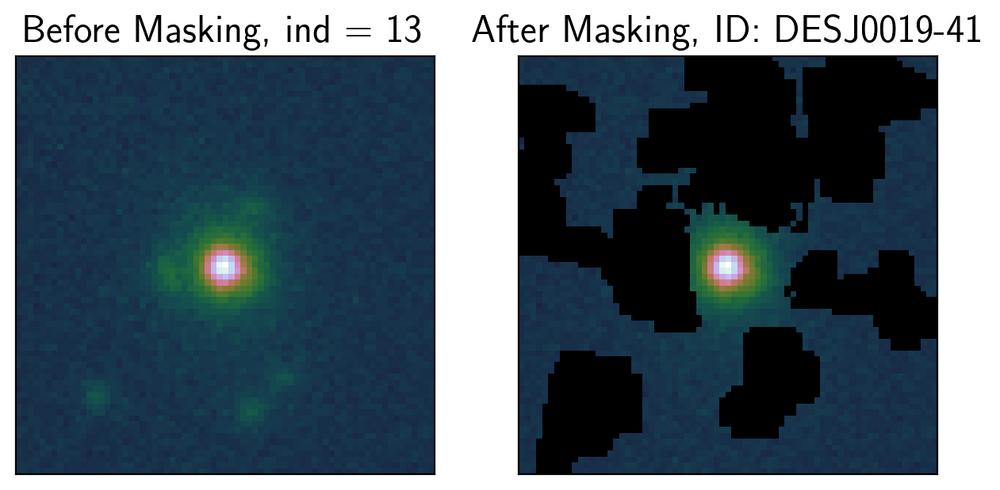

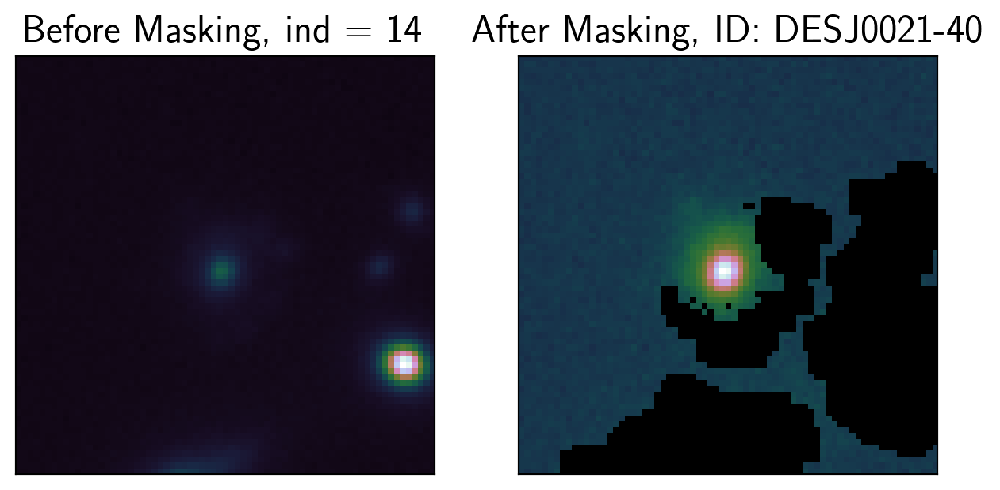

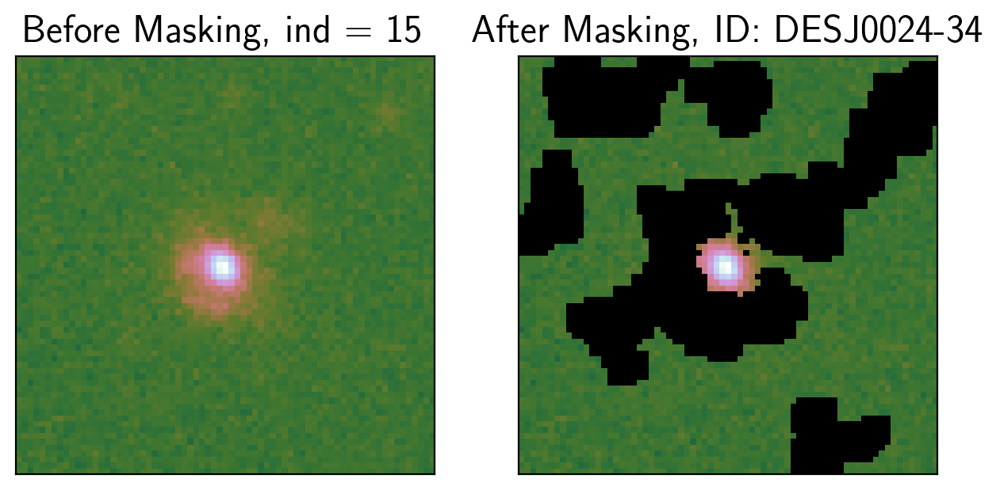

In [248]:
start = 10
end = 15

for i in range(start, end+1):
    filename_r = os.path.join(jr_path, files_r[i])
    filename_g = os.path.join(jg_path, files_g[i])

    test_r = read_fits_image(filename_r)
    test_g = read_fits_image(filename_g)
    
    split = filename_r.split('/')[9].split('.')
    
    desid = split[0][:-2] + split[1][4:7]

    print(desid)
    
    test_gal_g, stds_g = get_img_uncertainties(test_g)

    masked_gal, mask = create_mask(test_g, test_r, test_gal_g
                                   , num=5, box_num=10
                                   , mult=0.5, npix=25
                                  )
    
    plot_mask(test_r, mask
              , index=i, desid=desid
              , vmin=-50
             )

/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in sqrt
/Users/aidan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: Ru

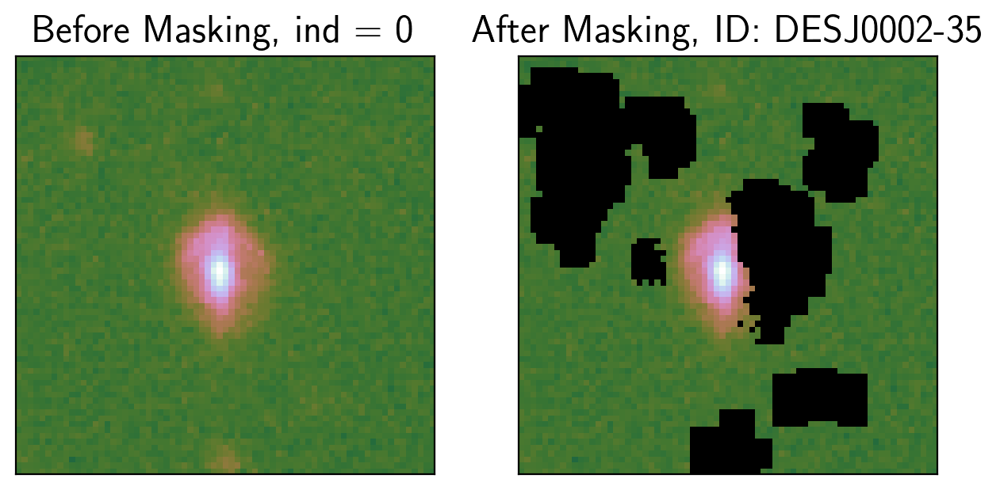

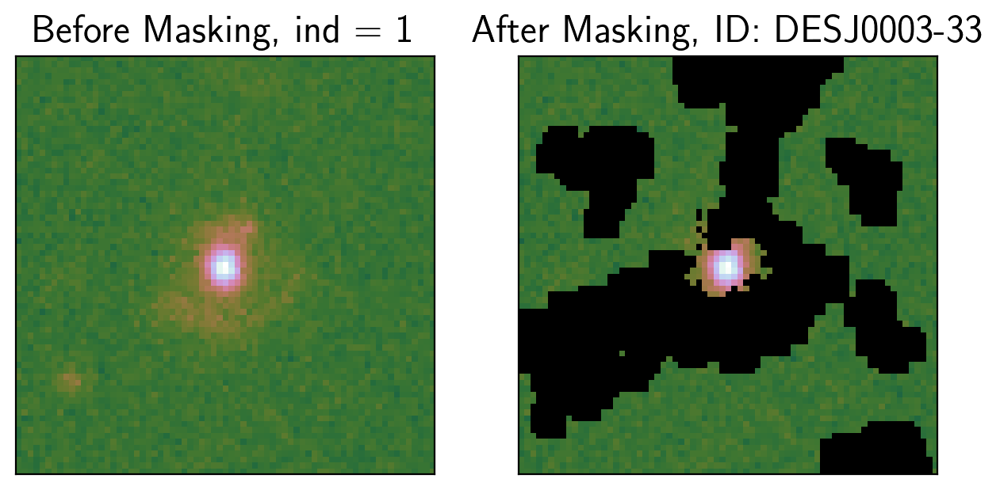

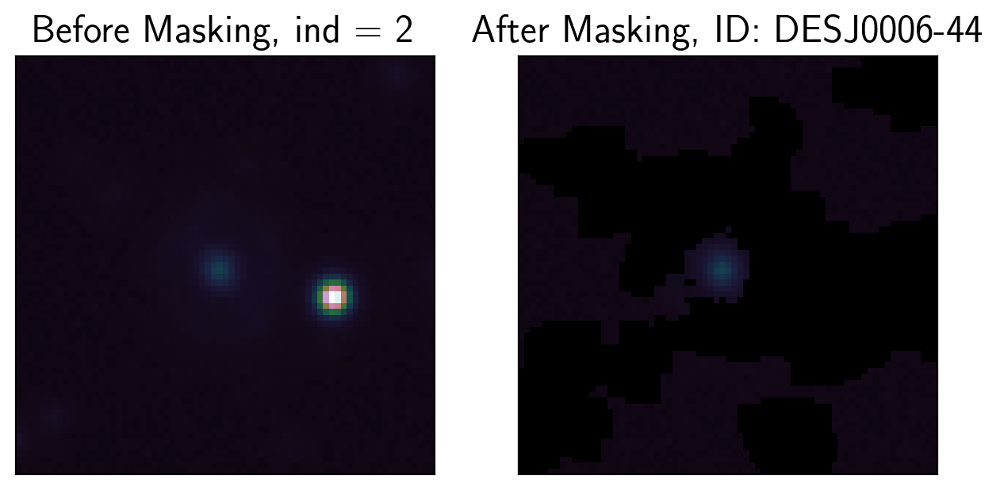

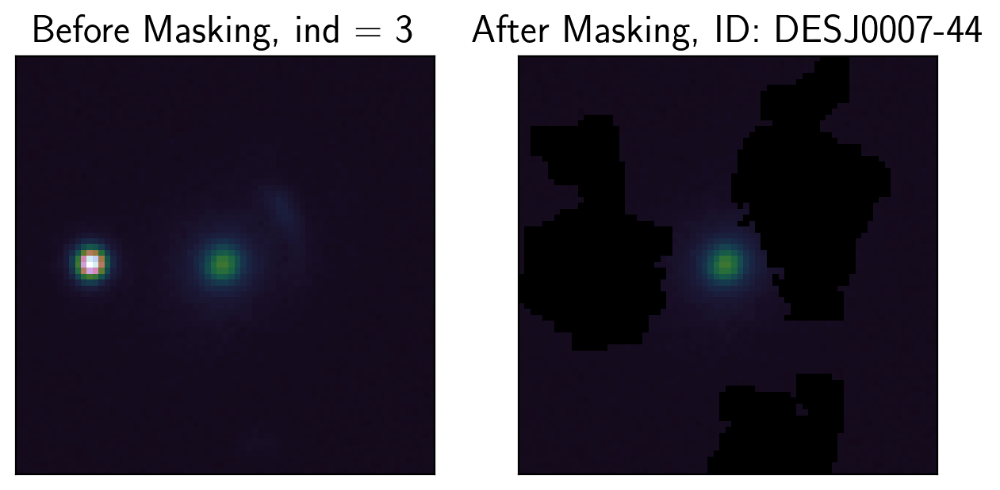

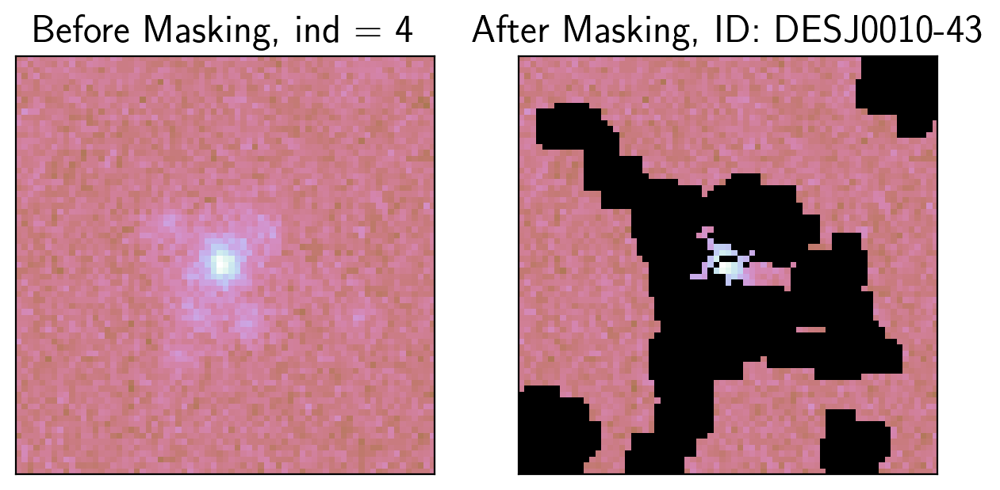

...

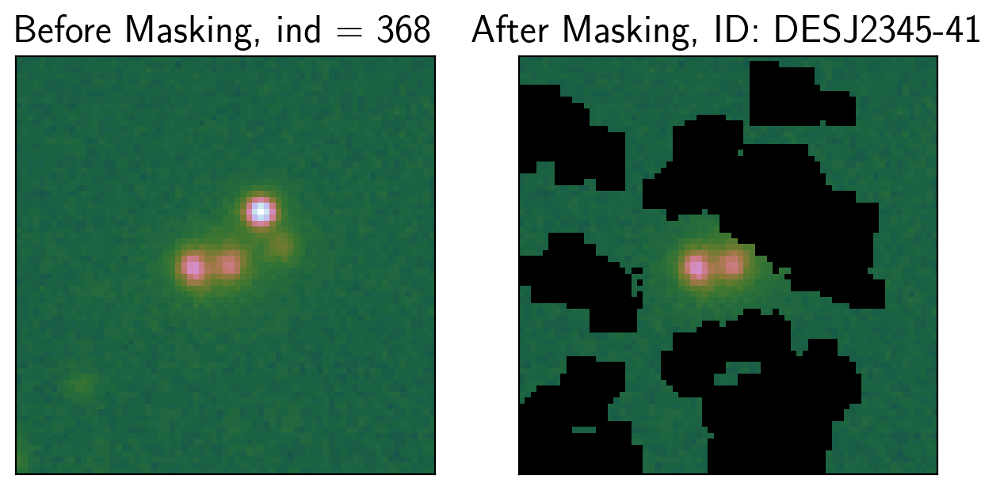

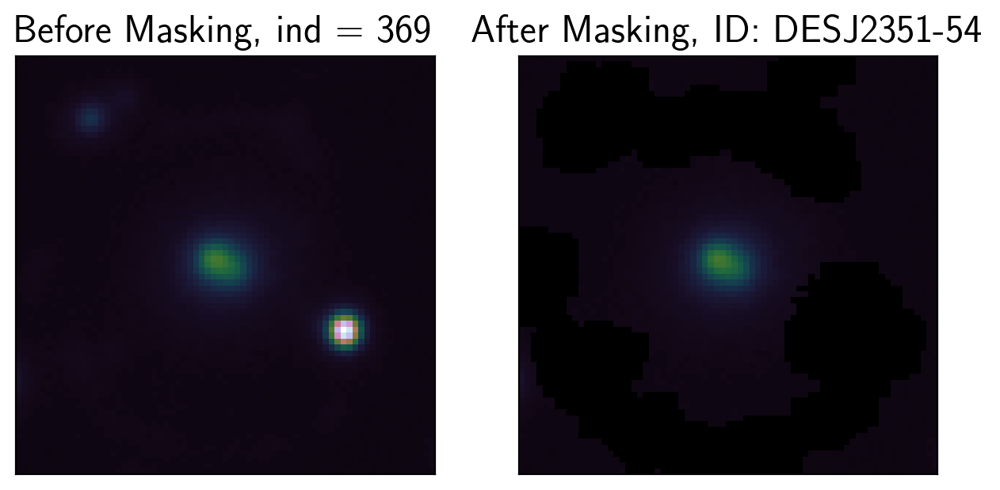

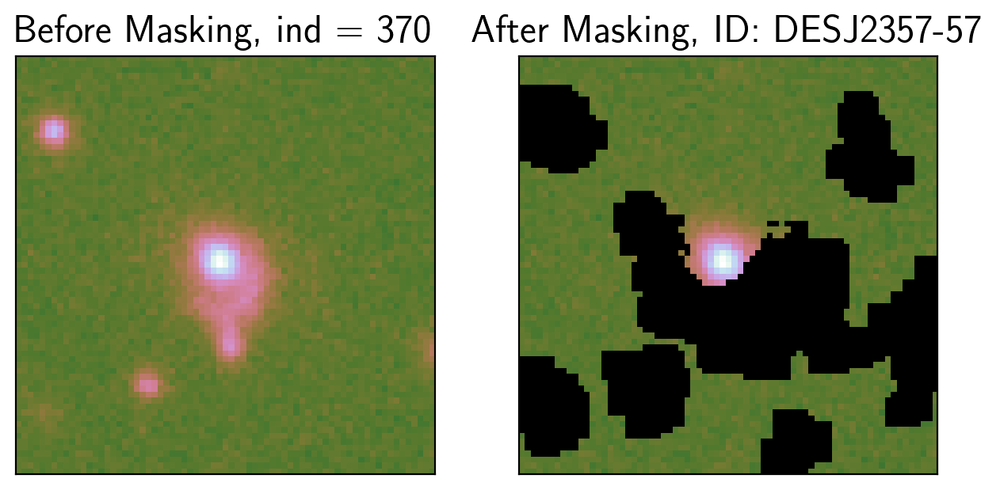

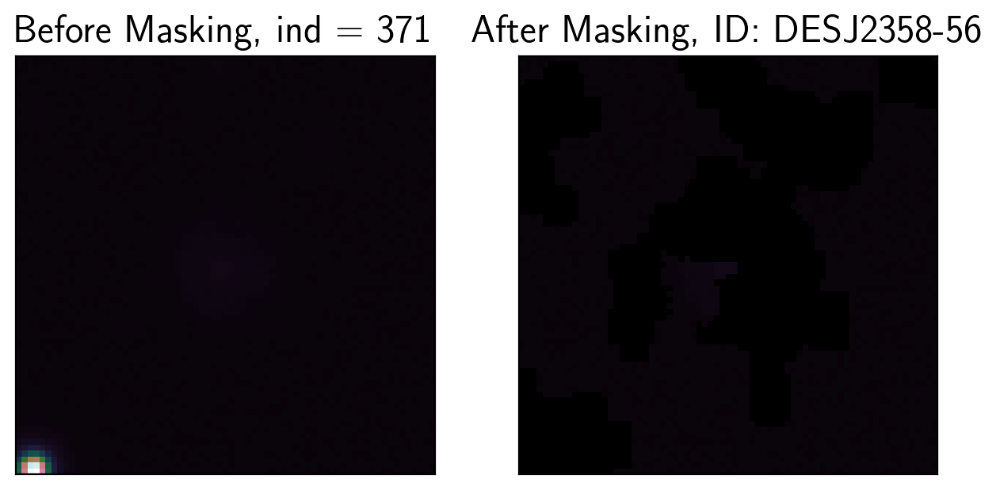

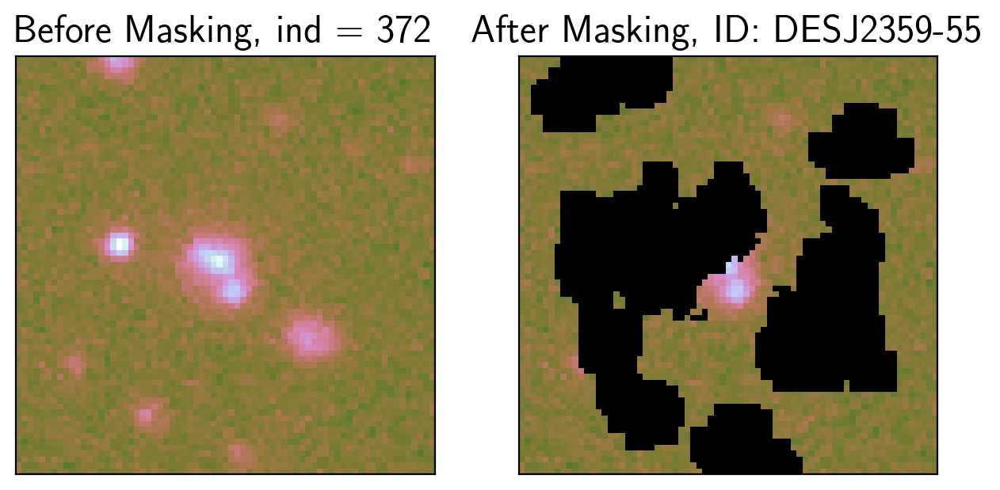

In [21]:

for i in range(len(files_r)):
    filename_r = os.path.join(jr_path, files_r[i])
    filename_g = os.path.join(jg_path, files_g[i])

    test_r = read_fits_image(filename_r)
    test_g = read_fits_image(filename_g)

    split = filename_r.split('/')[9].split('.')
    
    desid = split[0][:-2] + split[1][4:7]
    
    test_gal_g, stds_g = get_img_uncertainties(test_r)

    masked_gal, mask = create_mask(test_g, test_r, test_gal_g
                                   , num=5, box_num=10
                                   , mult=0.5, npix=25
                                  )
    
    plot_mask(test_r, mask
              , index=i, desid=desid
              , vmin=-60
             )